# Machine Learning
## Class 36.5 : Section 28: Logistic Regression
- Krish Udemy course : Complete Machine Learning,NLP Bootcamp MLOPS & Deployment. 20 hours of content for ML algo's

## Refer to hand notes in B11

### 3D curve for using MSE as cost function. Notice that there are multiple minima points ... it is better visible in 2d graph - by assuming beta_0 = 0 
- Generated 3D graph using plotly .. regenerate again to see the graph
- Also notice that the graph is not always decreasing - like you have in convex curve - so this is not suitable

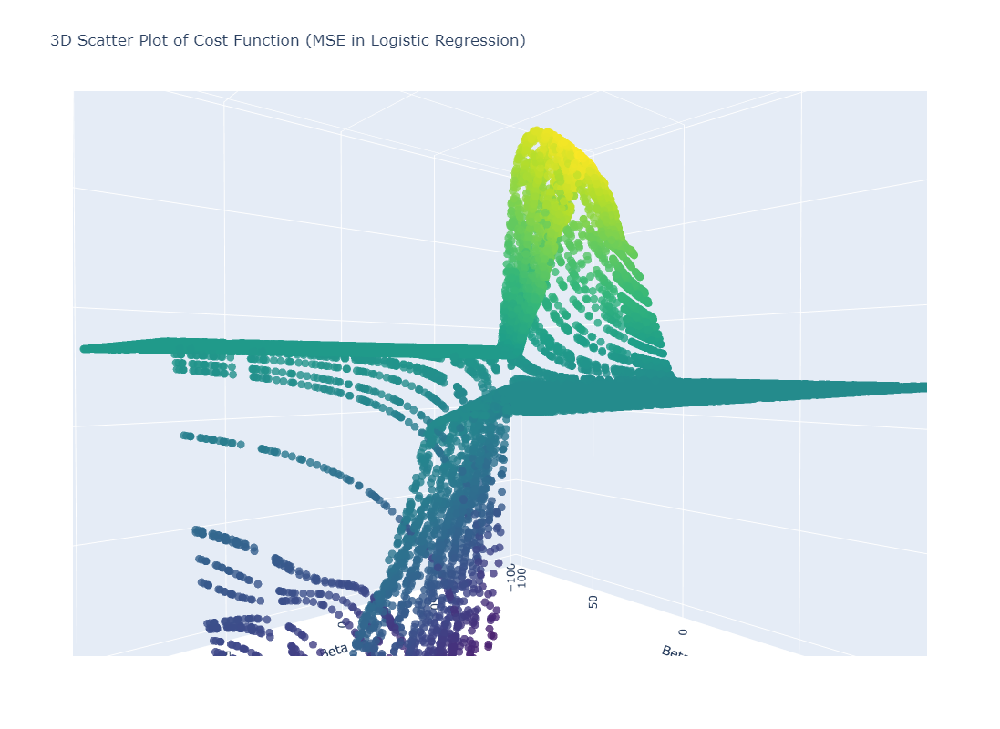

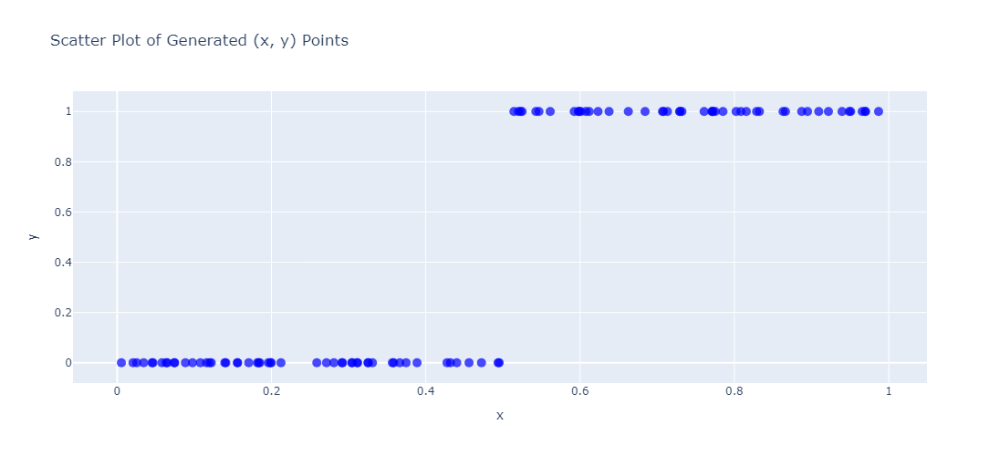

In [59]:
import numpy as np
import plotly.graph_objs as go
import plotly.io as pio

# Step 1: Generate 100 random data points (x, y) with a specific condition for y
np.random.seed(42)
x = np.random.rand(100)
y = np.where(x < 0.5, 0, 1)  # y = 0 for x < 0.5, y = 1 for x >= 0.5

# Step 2: Generate 1000 random values for beta_0 and beta_1
beta_0_values = np.random.rand(200) * 200 - 100  # Random values between -25 and 25
beta_1_values = np.random.rand(200) * 200 - 100  # Random values between -25 and 25

# Step 3: Calculate the cost function J(beta_0, beta_1)
def mse_logistic_cost(beta_0, beta_1, x, y):
    n = len(y)
    predictions = 1 / (1 + np.exp(-(beta_0 + beta_1 * x)))
    cost = (1 / (2 * n)) * np.sum((predictions - y) ** 2)
    return cost

# Create a grid to evaluate the cost function
beta_0_grid, beta_1_grid = np.meshgrid(beta_0_values, beta_1_values)
cost_values = np.zeros_like(beta_0_grid)

for i in range(len(beta_0_values)):
    for j in range(len(beta_1_values)):
        cost_values[i, j] = mse_logistic_cost(beta_0_grid[i, j], beta_1_grid[i, j], x, y)

# Step 4: Create a 3D scatter plot using Plotly
scatter_3d = go.Scatter3d(
    x=beta_0_grid.flatten(),
    y=beta_1_grid.flatten(),
    z=cost_values.flatten(),
    mode='markers',
    marker=dict(
        size=5,
        color=cost_values.flatten(),
        colorscale='Viridis',
        opacity=0.8
    )
)

layout_3d = go.Layout(
    title='3D Scatter Plot of Cost Function (MSE in Logistic Regression)',
    scene=dict(
        xaxis_title='Beta_0',
        yaxis_title='Beta_1',
        zaxis_title='Cost J(beta_0, beta_1)',
    ),
    width=1000,   # Increase the width of the plot
    height=800    # Increase the height of the plot
)

fig_3d = go.Figure(data=[scatter_3d], layout=layout_3d)
pio.show(fig_3d)

# Step 5: Create a 2D scatter plot of the (x, y) points
scatter_2d = go.Scatter(
    x=x,
    y=y,
    mode='markers',
    marker=dict(
        size=10,
        color='blue',
        opacity=0.7
    )
)

layout_2d = go.Layout(
    title='Scatter Plot of Generated (x, y) Points',
    xaxis_title='x',
    yaxis_title='y',
    width=600,
    height=500
)

fig_2d = go.Figure(data=[scatter_2d], layout=layout_2d)
pio.show(fig_2d)


### 2D curve for using MSE as cost function. Notice that there are multiple minima points

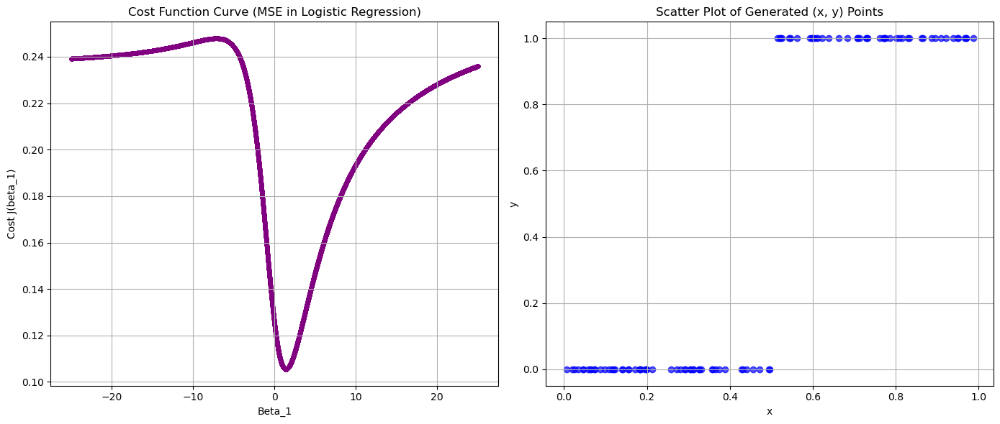

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate 100 random data points (x, y) with a specific condition for y
np.random.seed(42)
x = np.random.rand(100)
y = np.where(x < 0.5, 0, 1)  # y = 0 for x < 0.5, y = 1 for x >= 0.5

# Step 2: Generate 1000 random values for beta_1
beta_1_values = np.random.rand(100000) * 50 - 25  # Random values between -5 and 5

# Step 3: Calculate the cost function J(beta_1)
def mse_logistic_cost(beta_1, x, y):
    n = len(y)
    predictions = 1 / (1 + np.exp(-beta_1 * x))
    cost = (1 / (2 * n)) * np.sum((predictions - y) ** 2)
    return cost

# Calculate J(beta_1) for each beta_1
cost_values = np.array([mse_logistic_cost(beta_1, x, y) for beta_1 in beta_1_values])

# Step 4: Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot the cost function curve J(beta_1) in the first subplot
ax1.scatter(beta_1_values, cost_values, color='purple', alpha=0.6,marker='.')
ax1.set_xlabel('Beta_1')
ax1.set_ylabel('Cost J(beta_1)')
ax1.set_title('Cost Function Curve (MSE in Logistic Regression)')
ax1.grid(True)

# Plot the (x, y) points in the second subplot
ax2.scatter(x, y, color='blue', marker='o', alpha=0.7)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_title('Scatter Plot of Generated (x, y) Points')
ax2.grid(True)

# Adjust layout for a better fit
plt.tight_layout()
plt.show()


### 3D curve for using "LOG LOSS" as cost function.  
- Generated 3D graph using plotly .. regenerate again to see the graph
- Graph is similar to MSE cost function - slightly better - as the curve is less steep - but not sure

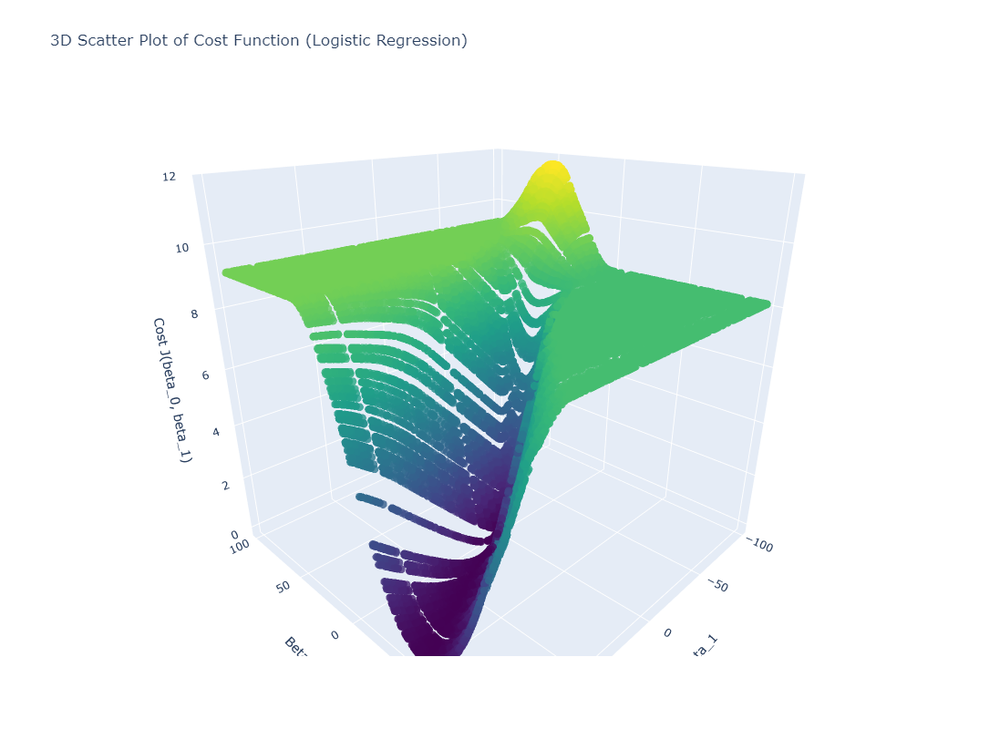

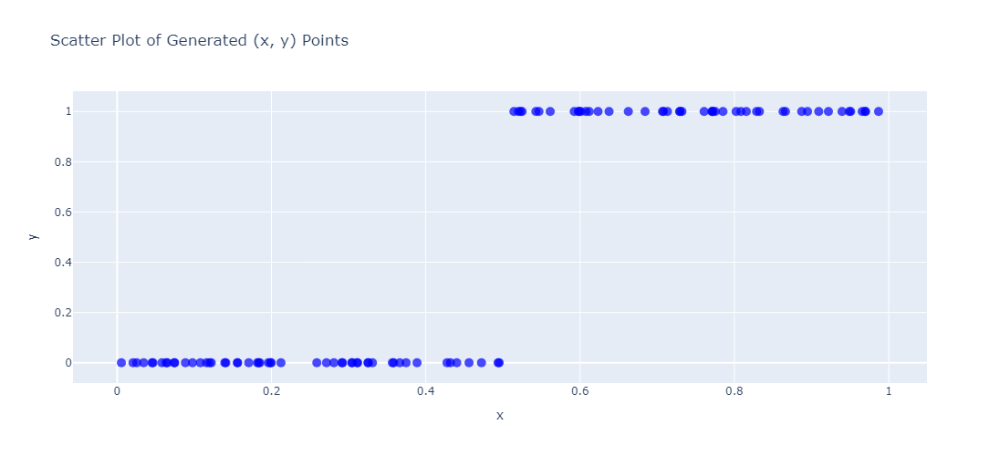

In [57]:
import numpy as np
import plotly.graph_objs as go
import plotly.io as pio

# Step 1: Generate 100 random data points (x, y) with a specific condition for y
np.random.seed(42)
x = np.random.rand(100)
y = np.where(x < 0.5, 0, 1)  # y = 0 for x < 0.5, y = 1 for x >= 0.5

# Step 2: Generate 1000 random values for beta_0 and beta_1
beta_0_values = np.random.rand(200) * 200 - 100  # Random values between -25 and 25
beta_1_values = np.random.rand(200) * 200 - 100  # Random values between -25 and 25

# Step 3: Calculate the cost function J(beta_0, beta_1)
def logistic_cost(beta_0, beta_1, x, y):
    n = len(y)
    predictions = 1 / (1 + np.exp(-(beta_0 + beta_1 * x)))
    # Avoid log(0) by setting a minimum value for predictions
    predictions = np.clip(predictions, 1e-15, 1 - 1e-15)
    cost = (1 / (2 * n)) * np.sum(
        -y * np.log(predictions) - (1 - y) * np.log(1 - predictions)
    )
    return cost

# Create a grid to evaluate the cost function
beta_0_grid, beta_1_grid = np.meshgrid(beta_0_values, beta_1_values)
cost_values = np.zeros_like(beta_0_grid)

for i in range(len(beta_0_values)):
    for j in range(len(beta_1_values)):
        cost_values[i, j] = logistic_cost(beta_0_grid[i, j], beta_1_grid[i, j], x, y)

# Step 4: Create a 3D scatter plot using Plotly
scatter_3d = go.Scatter3d(
    x=beta_0_grid.flatten(),
    y=beta_1_grid.flatten(),
    z=cost_values.flatten(),
    mode='markers',
    marker=dict(
        size=5,
        color=cost_values.flatten(),
        colorscale='Viridis',
        opacity=0.8
    )
)

layout_3d = go.Layout(
    title='3D Scatter Plot of Cost Function (Logistic Regression)',
    scene=dict(
        xaxis_title='Beta_0',
        yaxis_title='Beta_1',
        zaxis_title='Cost J(beta_0, beta_1)',
    ),
    width=1000,   # Increase the width of the plot
    height=800    # Increase the height of the plot
)

fig_3d = go.Figure(data=[scatter_3d], layout=layout_3d)
pio.show(fig_3d)

# Step 5: Create a 2D scatter plot of the (x, y) points
scatter_2d = go.Scatter(
    x=x,
    y=y,
    mode='markers',
    marker=dict(
        size=10,
        color='blue',
        opacity=0.7
    )
)

layout_2d = go.Layout(
    title='Scatter Plot of Generated (x, y) Points',
    xaxis_title='x',
    yaxis_title='y',
    width=600,
    height=500
)

fig_2d = go.Figure(data=[scatter_2d], layout=layout_2d)
pio.show(fig_2d)


## Class 36.5 : Section 28: Logistic Regression
### 176. Logistic Regression implementation

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [60]:
from sklearn.datasets import make_classification

In [63]:
## create the dataset
X,y=make_classification(n_samples=1000,n_features=10,n_classes=2,random_state=42)
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9
0,0.964799,-0.066449,0.986768,-0.358079,0.997266,1.181890,-1.615679,-1.210161,-0.628077,1.227274
1,-0.916511,-0.566395,-1.008614,0.831617,-1.176962,1.820544,1.752375,-0.984534,0.363896,0.209470
2,-0.109484,-0.432774,-0.457649,0.793818,-0.268646,-1.836360,1.239086,-0.246383,-1.058145,-0.297376
3,1.750412,2.023606,1.688159,0.006800,-1.607661,0.184741,-2.619427,-0.357445,-1.473127,-0.190039
4,-0.224726,-0.711303,-0.220778,0.117124,1.536061,0.597538,0.348645,-0.939156,0.175915,0.236224
...,...,...,...,...,...,...,...,...,...,...
995,-1.367638,1.462255,-1.154918,-0.290454,-0.413424,0.032396,1.545490,1.428760,1.687092,1.072542
996,-1.514876,-3.221016,-1.300744,0.395599,-0.527994,1.353069,1.777506,-1.680870,1.798510,0.034272
997,1.674633,1.754933,1.586154,0.018402,-1.514470,0.321593,-2.417694,0.692723,-1.503850,0.225264
998,-0.778609,-0.835689,-0.194842,1.097220,0.180071,-0.272933,-0.533188,-0.497354,2.472138,0.867187


In [64]:
pd.DataFrame(y)

,0
0,0
1,1
2,1
3,0
4,1
...,...
995,1
996,1
997,0
998,0


In [66]:
# Train test split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=42)

In [68]:
# model training
from sklearn.linear_model import LogisticRegression
logistic=LogisticRegression()
logistic.fit(X_train,y_train)

y_pred = logistic.predict(X_test)
y_pred

array([0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0])

In [70]:
# Used to display the actual probability value using the sigmoid function ... .predict directly gives the y after applying the 
# decision boundary threshold ... for binary classification - it gives probablity of 1, probabilility of 0 .. as 2D array
logistic.predict_proba(X_test) 

array([[7.74477909e-01, 2.25522091e-01],
       [3.36684957e-02, 9.66331504e-01],
       [6.70682154e-01, 3.29317846e-01],
       [7.98668032e-02, 9.20133197e-01],
       [9.76616650e-01, 2.33833501e-02],
       [4.13572804e-02, 9.58642720e-01],
       [9.79028767e-01, 2.09712329e-02],
       [9.59367261e-01, 4.06327393e-02],
       [8.08520049e-01, 1.91479951e-01],
       [6.84954318e-01, 3.15045682e-01],
       [9.13669448e-01, 8.63305524e-02],
       [2.63597018e-01, 7.36402982e-01],
       [5.25844192e-01, 4.74155808e-01],
       [2.11912354e-01, 7.88087646e-01],
       [7.93592056e-01, 2.06407944e-01],
       [9.46621678e-01, 5.33783219e-02],
       [2.62957933e-02, 9.73704207e-01],
       [3.24212617e-01, 6.75787383e-01],
       [3.14803584e-01, 6.85196416e-01],
       [2.04956217e-01, 7.95043783e-01],
       [5.04587065e-01, 4.95412935e-01],
       [9.66703630e-01, 3.32963696e-02],
       [2.00514796e-01, 7.99485204e-01],
       [7.77891908e-01, 2.22108092e-01],
       [8.729863

In [71]:
## performance metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)


0.8466666666666667
[[118  17]
 [ 29 136]]
              precision    recall  f1-score   support

           0       0.80      0.87      0.84       135
           1       0.89      0.82      0.86       165

    accuracy                           0.85       300
   macro avg       0.85      0.85      0.85       300
weighted avg       0.85      0.85      0.85       300



## Class 36.5 : Section 28: Logistic Regression
### 177. GridSearchCV - for Grid Search

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [75]:
from sklearn.datasets import make_classification

In [76]:
## create the dataset
X,y=make_classification(n_samples=1000,n_features=10,n_classes=2,random_state=42)

# Train test split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=42)

In [110]:
# Defining GridSearch parameters
model = LogisticRegression()
penalty=['l1','l2','elasticnet']
c_value=[100,10,1.0,0.1,0.01]    # C is ( 1 / alpha ) for L1 / L2 regularization 
solver_value = ['newton-cg','lbfgs','liblinear','sag','saga']


In [79]:
params=dict(penalty=penalty,C=c_value,solver=solver_value)
params

{'penalty': ['l1', 'l2', 'elasticnet'],
 'C': [100, 10, 1.0, 0.1, 0.01],
 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

In [81]:
# Defining cross-validation strategy
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold()

In [83]:
## GridSearchCV
from sklearn.model_selection import GridSearchCV
grid = GridSearchCV(estimator = model, param_grid=params, scoring='accuracy',cv=cv,n_jobs=-1)
grid

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [84]:
grid.fit(X_train,y_train)

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning:


200 fits failed out of a total of 375.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_logistic.py", line 1172, in fit
   

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [85]:
grid.best_params_

{'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}

In [86]:
grid.best_score_

0.8785714285714287

In [87]:
y_pred=grid.predict(X_test)

## performance metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)

0.8533333333333334
[[124  11]
 [ 33 132]]
              precision    recall  f1-score   support

           0       0.79      0.92      0.85       135
           1       0.92      0.80      0.86       165

    accuracy                           0.85       300
   macro avg       0.86      0.86      0.85       300
weighted avg       0.86      0.85      0.85       300



## Class 36.5 : Section 28: Logistic Regression
### 178. RandomizedSearchCV - for Randomized Search CV
- Grid Search takes more time - as it scan each and every parameter combination ... randomized search CV is faster

In [88]:
# Defining GridSearch parameters
model = LogisticRegression()
penalty=['l1','l2','elasticnet']
c_value=[100,10,1.0,0.1,0.01]
solver_value = ['newton-cg','lbfgs','liblinear','sag','saga']


In [89]:
params=dict(penalty=penalty,C=c_value,solver=solver_value)
params

{'penalty': ['l1', 'l2', 'elasticnet'],
 'C': [100, 10, 1.0, 0.1, 0.01],
 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

In [90]:
# Defining cross-validation strategy
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold()

In [95]:
## GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
randomcv = RandomizedSearchCV(estimator = model, param_distributions=params, scoring='accuracy',cv=cv,n_jobs=-1)
randomcv

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'C': [100, 10, 1.0, 0.1, 0.01],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   scoring='accuracy')

In [96]:
randomcv.fit(X_train,y_train)

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning:


25 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_logistic.py", line 1172, in fit
    so

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'C': [100, 10, 1.0, 0.1, 0.01],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   scoring='accuracy')

In [97]:
randomcv.best_params_

{'solver': 'liblinear', 'penalty': 'l1', 'C': 0.1}

In [98]:
randomcv.best_score_

0.8742857142857143

In [99]:
y_pred=randomcv.predict(X_test)

## performance metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)

0.8533333333333334
[[123  12]
 [ 32 133]]
              precision    recall  f1-score   support

           0       0.79      0.91      0.85       135
           1       0.92      0.81      0.86       165

    accuracy                           0.85       300
   macro avg       0.86      0.86      0.85       300
weighted avg       0.86      0.85      0.85       300



## Class 36.5 : Section 28: Logistic Regression
### 179. Logistic OVR
- OVR - One versus Rest
- Logistic regression for multi-class classification 

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [75]:
from sklearn.datasets import make_classification

In [102]:
## create the dataset
X,y=make_classification(n_samples=1000,n_features=10,n_informative=3,n_classes=3,random_state=42) # Creating 3 classes
pd.DataFrame(y).value_counts() # notice that there are 3 classes in y now

0
2    335
0    334
1    331
Name: count, dtype: int64

In [103]:
# Train test split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=42)

In [104]:
from sklearn.linear_model import LogisticRegression
logistic = LogisticRegression(multi_class='ovr') # defining OVR for logistic

logistic.fit(X_train,y_train)
y_pred=logistic.predict(X_test)
y_pred

array([2, 0, 1, 2, 0, 1, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0,
       2, 0, 1, 0, 2, 1, 0, 2, 2, 0, 1, 0, 0, 2, 2, 2, 1, 0, 0, 1, 2, 0,
       1, 2, 1, 0, 1, 1, 2, 0, 1, 0, 2, 2, 2, 2, 1, 2, 0, 2, 2, 2, 1, 1,
       0, 1, 0, 1, 0, 2, 2, 0, 0, 0, 2, 1, 1, 2, 2, 0, 2, 1, 0, 1, 1, 2,
       1, 1, 2, 2, 1, 2, 2, 2, 1, 0, 0, 0, 0, 2, 1, 0, 2, 1, 1, 0, 0, 2,
       0, 1, 2, 0, 0, 0, 1, 1, 2, 2, 1, 0, 0, 1, 2, 0, 0, 1, 0, 2, 1, 0,
       2, 2, 2, 0, 0, 1, 2, 1, 2, 1, 2, 1, 2, 2, 2, 0, 0, 1, 2, 0, 0, 2,
       1, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 2, 2, 1, 2, 1, 0, 2, 1, 0, 0, 2,
       0, 1, 1, 2, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 1, 2, 2, 1, 2,
       0, 1, 2, 2, 1, 1, 0, 2, 1, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 1, 0, 1, 2, 0, 0, 2,
       0, 2, 0, 0, 2, 2, 0, 2, 2, 0, 1, 2, 2, 0, 1, 1, 0, 1, 2, 0, 2, 2,
       0, 0, 0, 2, 1, 2, 0, 2, 2, 2, 0, 2, 0, 2, 2, 0, 0, 1, 0, 2, 2, 2,
       0, 2, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 0, 1])

In [108]:
# Used to display the actual probability value using the sigmoid function ... .predict directly gives the y after applying the 
# decision boundary threshold ... for multi-class classification - it gives probablity for each class in columns .. for each record as 2D array
logistic.predict_proba(X_test) 

array([[9.22522618e-03, 2.44034837e-01, 7.46739937e-01],
       [4.89544732e-01, 2.45683892e-01, 2.64771376e-01],
       [3.54058728e-01, 5.90982894e-01, 5.49583777e-02],
       [3.61503652e-02, 1.82525799e-01, 7.81323836e-01],
       [4.01755652e-01, 3.69771801e-01, 2.28472547e-01],
       [3.83231093e-01, 5.21315790e-01, 9.54531172e-02],
       [2.80650254e-01, 2.18835528e-01, 5.00514218e-01],
       [6.86748730e-01, 3.10472372e-01, 2.77889720e-03],
       [5.72702266e-01, 4.24212176e-01, 3.08555794e-03],
       [2.69546511e-02, 1.49732219e-01, 8.23313130e-01],
       [7.81732426e-02, 2.40515273e-01, 6.81311484e-01],
       [1.25869742e-02, 1.72900197e-01, 8.14512828e-01],
       [4.99079983e-02, 1.76510922e-01, 7.73581080e-01],
       [3.95794074e-02, 3.56708621e-01, 6.03711972e-01],
       [2.01209577e-02, 2.98735180e-01, 6.81143862e-01],
       [7.35993162e-03, 2.18049789e-01, 7.74590279e-01],
       [2.71868855e-02, 2.81421225e-01, 6.91391890e-01],
       [2.36865580e-01, 4.86991

In [105]:
## performance metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)

0.68
[[79 16  8]
 [31 38 27]
 [ 3 11 87]]
              precision    recall  f1-score   support

           0       0.70      0.77      0.73       103
           1       0.58      0.40      0.47        96
           2       0.71      0.86      0.78       101

    accuracy                           0.68       300
   macro avg       0.67      0.67      0.66       300
weighted avg       0.67      0.68      0.66       300



## Class 36.5 : Section 28: Logistic Regression
### 180. Logistic Imbalanced Dataset

In [116]:
# Generate and plot a synthetic imbalanced classification dataset
from collections import Counter
from sklearn.datasets import make_classification


In [120]:
## imbalanced dataset
X,y=make_classification(n_samples=10000,n_features=2,n_clusters_per_class=1,
                   n_redundant=0,weights=[0.99],random_state=10)  # Create 2 clusters of data ... where cluster 1 has 99% weight
pd.DataFrame(X)

,0,1
0,1.879910,-1.485035
1,0.377083,-2.238585
2,1.354312,-2.664638
3,-0.509843,-1.502950
4,0.863561,-1.906364
...,...,...
9995,1.066698,-0.548159
9996,1.058723,-0.933768
9997,0.995099,-0.541924
9998,1.758594,-1.549612


In [121]:
Counter(y)

Counter({0: 9846, 1: 154})

<Axes: xlabel='0', ylabel='1'>

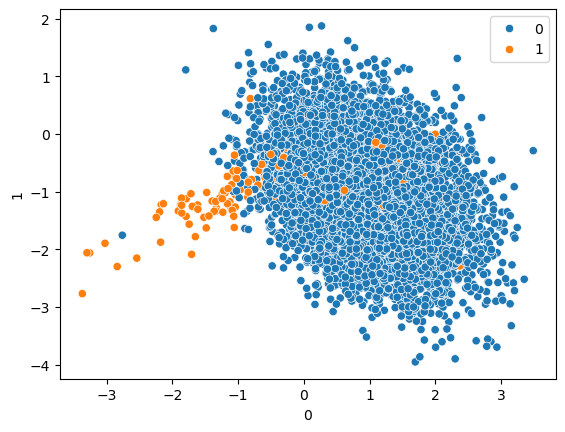

In [124]:
import seaborn as sns
import pandas as pd
sns.scatterplot(x=pd.DataFrame(X)[0],y=pd.DataFrame(X)[1],hue=y) # Plotting x1 and x2 ... and labelling them with colour based on y

In [125]:
## Split the dataset into train and test
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [128]:
# Defining class_weight paramater grid for (y_class1 and y_class2)
class_weight=[{0:weight_y_class1,1:weight_y_class2} for weight_y_class1 in [1,10,50,100] for weight_y_class2 in [1,10,50,100]]
class_weight

[{0: 1, 1: 1},
 {0: 1, 1: 10},
 {0: 1, 1: 50},
 {0: 1, 1: 100},
 {0: 10, 1: 1},
 {0: 10, 1: 10},
 {0: 10, 1: 50},
 {0: 10, 1: 100},
 {0: 50, 1: 1},
 {0: 50, 1: 10},
 {0: 50, 1: 50},
 {0: 50, 1: 100},
 {0: 100, 1: 1},
 {0: 100, 1: 10},
 {0: 100, 1: 50},
 {0: 100, 1: 100}]

In [129]:
## Defining all params for Hyperparamter tuning
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
penalty=['l1', 'l2', 'elasticnet']
c_values=[100,10,1.0,0.1,0.01]
solver=['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
class_weight=class_weight
params=dict(penalty=penalty,C=c_values,solver=solver,class_weight=class_weight)
params

{'penalty': ['l1', 'l2', 'elasticnet'],
 'C': [100, 10, 1.0, 0.1, 0.01],
 'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
 'class_weight': [{0: 1, 1: 1},
  {0: 1, 1: 10},
  {0: 1, 1: 50},
  {0: 1, 1: 100},
  {0: 10, 1: 1},
  {0: 10, 1: 10},
  {0: 10, 1: 50},
  {0: 10, 1: 100},
  {0: 50, 1: 1},
  {0: 50, 1: 10},
  {0: 50, 1: 50},
  {0: 50, 1: 100},
  {0: 100, 1: 1},
  {0: 100, 1: 10},
  {0: 100, 1: 50},
  {0: 100, 1: 100}]}

In [130]:
## Hyperparameter tuning and fitting the train data
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
cv=StratifiedKFold()
grid=GridSearchCV(estimator=model,param_grid=params,scoring='accuracy',cv=cv)

grid.fit(X_train,y_train)

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\suvam\anaconda3_2\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\s

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(),
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01],
                         'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 10},
                                          {0: 1, 1: 50}, {0: 1, 1: 100},
                                          {0: 10, 1: 1}, {0: 10, 1: 10},
                                          {0: 10, 1: 50}, {0: 10, 1: 100},
                                          {0: 50, 1: 1}, {0: 50, 1: 10},
                                          {0: 50, 1: 50}, {0: 50, 1: 100},
                                          {0: 100, 1: 1}, {0: 100, 1: 10},
                                          {0: 100, 1: 50}, {0: 100, 1: 100}],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

In [131]:
grid.best_params_

{'C': 0.01,
 'class_weight': {0: 10, 1: 50},
 'penalty': 'l2',
 'solver': 'newton-cg'}

In [132]:
y_pred=grid.predict(X_test)

In [135]:
## performance metrics
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)

0.992
[[2468    2]
 [  18   12]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2470
           1       0.86      0.40      0.55        30

    accuracy                           0.99      2500
   macro avg       0.92      0.70      0.77      2500
weighted avg       0.99      0.99      0.99      2500



## Logistic Regression With ROC curve And ROC AUC score 
- Refer to hand notes for definition of FPR, TPR, how to remember them, ROC curve, its explaination and interpretation, and AUC curve explaination and interpretation

In [210]:
# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

In [227]:
# generate 2 class dataset
X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)

In [228]:
## Split the dataset into train and test
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=0)

In [229]:
# Created a dummy model with default 0 as output 
dummy_model_prob = [0 for _ in range(len(y_test))]
dummy_model_prob

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [230]:
## Lets Create Basic Logistic Model
model=LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [231]:
## Prediction based on probability
model_prob=model.predict_proba(X_test)
model_prob

array([[8.17237415e-02, 9.18276259e-01],
       [1.13344259e-01, 8.86655741e-01],
       [9.76832552e-01, 2.31674481e-02],
       [1.81093915e-02, 9.81890609e-01],
       [4.54686794e-02, 9.54531321e-01],
       [2.03249282e-01, 7.96750718e-01],
       [9.93162656e-01, 6.83734407e-03],
       [9.45976087e-01, 5.40239126e-02],
       [8.69028777e-03, 9.91309712e-01],
       [5.91398651e-01, 4.08601349e-01],
       [9.85074068e-01, 1.49259319e-02],
       [8.29281652e-02, 9.17071835e-01],
       [1.37466495e-01, 8.62533505e-01],
       [5.20697767e-03, 9.94793022e-01],
       [9.60063575e-01, 3.99364247e-02],
       [9.50688533e-01, 4.93114672e-02],
       [2.10393564e-02, 9.78960644e-01],
       [8.30240259e-01, 1.69759741e-01],
       [9.62818718e-01, 3.71812822e-02],
       [3.21780632e-02, 9.67821937e-01],
       [9.96085581e-01, 3.91441895e-03],
       [1.14045645e-01, 8.85954355e-01],
       [1.80352806e-01, 8.19647194e-01],
       [4.30414556e-01, 5.69585444e-01],
       [4.115915

In [232]:
## Lets focus on the positive outcome
model_prob=model_prob[:,1]

In [233]:
## Lets calulcate the scores
dummy_model_auc=roc_auc_score(y_test,dummy_model_prob)
model_auc=roc_auc_score(y_test,model_prob)
print(dummy_model_auc)
print(model_auc)

0.5
0.907648


## ROC curve : Plotting TPR in y axis and FPR in x-axis 

In [234]:
## calculate ROC Curves
dummy_fpr, dummy_tpr, _ = roc_curve(y_test, dummy_model_prob)
model_fpr, model_tpr, thresholds = roc_curve(y_test, model_prob)

In [235]:
thresholds

array([           inf, 9.99408591e-01, 9.48789051e-01, 9.45875797e-01,
       9.35535228e-01, 9.34011458e-01, 9.28076959e-01, 9.26098222e-01,
       9.09462284e-01, 9.01743080e-01, 8.97971882e-01, 8.87913921e-01,
       8.55039135e-01, 8.50088338e-01, 8.45804170e-01, 8.32576905e-01,
       8.19647194e-01, 8.15943076e-01, 8.07941846e-01, 8.01595231e-01,
       7.72502908e-01, 7.72061776e-01, 7.18381195e-01, 7.16495666e-01,
       6.62185322e-01, 6.29275041e-01, 6.17835757e-01, 6.10039921e-01,
       5.96301960e-01, 5.88408407e-01, 5.69585444e-01, 5.42664587e-01,
       5.29164218e-01, 5.13611459e-01, 5.10245990e-01, 4.87974294e-01,
       4.84907445e-01, 4.56156711e-01, 4.47168571e-01, 4.26498394e-01,
       3.64869889e-01, 3.56886293e-01, 3.46033141e-01, 3.08051495e-01,
       3.01298121e-01, 2.85600699e-01, 2.85090339e-01, 2.18727039e-01,
       1.97022170e-01, 1.34038345e-01, 1.33315877e-01, 1.30519699e-01,
       1.27153287e-01, 1.04921781e-01, 1.04292580e-01, 7.04849255e-02,
      

In [236]:
model_fpr,model_tpr

(array([0.   , 0.   , 0.   , 0.008, 0.008, 0.016, 0.016, 0.024, 0.024,
        0.032, 0.032, 0.048, 0.048, 0.056, 0.056, 0.072, 0.072, 0.08 ,
        0.08 , 0.088, 0.088, 0.096, 0.096, 0.104, 0.104, 0.112, 0.112,
        0.128, 0.128, 0.136, 0.136, 0.144, 0.144, 0.16 , 0.16 , 0.184,
        0.184, 0.2  , 0.2  , 0.208, 0.208, 0.224, 0.224, 0.24 , 0.24 ,
        0.256, 0.256, 0.296, 0.296, 0.392, 0.392, 0.4  , 0.4  , 0.448,
        0.448, 0.528, 0.528, 0.56 , 0.56 , 0.624, 0.624, 0.952, 0.952,
        1.   ]),
 array([0.   , 0.008, 0.288, 0.288, 0.368, 0.368, 0.376, 0.376, 0.424,
        0.424, 0.44 , 0.44 , 0.528, 0.528, 0.552, 0.552, 0.608, 0.608,
        0.64 , 0.64 , 0.664, 0.664, 0.704, 0.704, 0.752, 0.752, 0.784,
        0.784, 0.792, 0.792, 0.808, 0.808, 0.824, 0.824, 0.832, 0.832,
        0.84 , 0.84 , 0.848, 0.848, 0.904, 0.904, 0.912, 0.912, 0.92 ,
        0.92 , 0.928, 0.928, 0.944, 0.944, 0.952, 0.952, 0.96 , 0.96 ,
        0.968, 0.968, 0.976, 0.976, 0.984, 0.984, 0.992, 0.9

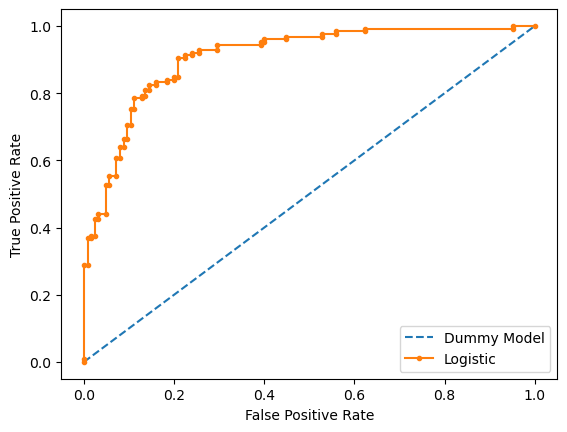

In [237]:
# plot the roc curve for the model
import seaborn as sns

pyplot.plot(dummy_fpr, dummy_tpr, linestyle='--', label='Dummy Model')
pyplot.plot(model_fpr, model_tpr, marker='.', label='Logistic')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

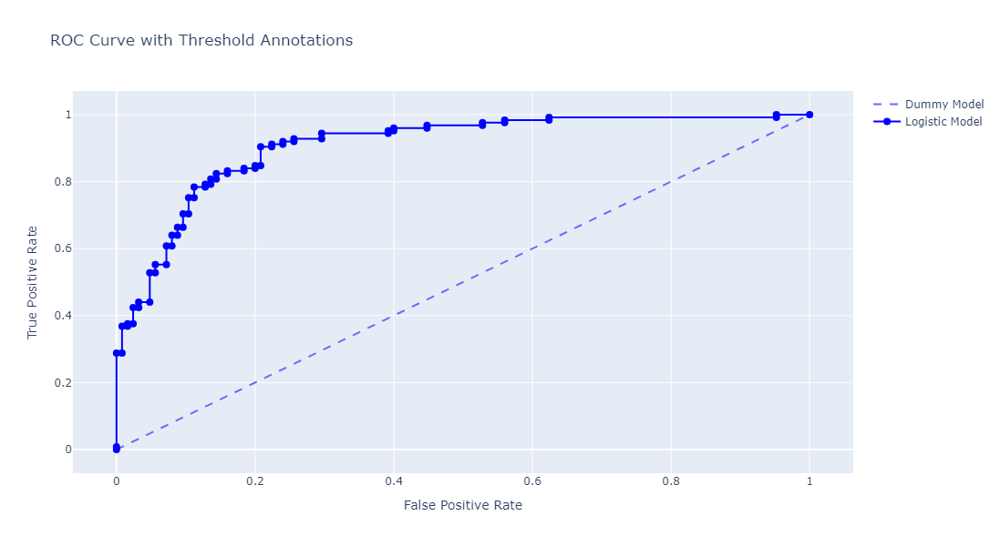

In [238]:
# plotting the roc curve for the model in plotly - and display threshold value at each point upon hover

import plotly.graph_objs as go

# Create traces for Dummy Model and Logistic Model ROC curves
trace_dummy = go.Scatter(
    x=dummy_fpr,
    y=dummy_tpr,
    mode='lines',
    name='Dummy Model',
    line=dict(dash='dash')
)

trace_logistic = go.Scatter(
    x=model_fpr,
    y=model_tpr,
    mode='lines+markers',
    name='Logistic Model',
    text=[f'Threshold: {round(thresh, 2)}' for thresh in thresholds],
    hoverinfo='text+x+y',
    marker=dict(size=8, color='blue')
)

# Set up the layout for the plot
layout = go.Layout(
    title='ROC Curve with Threshold Annotations',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    width=1100,
    height=600
)

# Create the figure and add the traces
fig = go.Figure(data=[trace_dummy, trace_logistic], layout=layout)

# Show the plot
fig.show()


## Finding Optimal threshold value

In [239]:
optimal_idx = np.argmax(model_tpr - model_fpr)

# Find the optimal threshold
optimal_threshold = thresholds[optimal_idx]

# Print the optimal threshold value
print("The optimal threshold is: ",optimal_threshold)


The optimal threshold is:  0.36486988857907


In [240]:
# Prediction based on optimal threshold
y_pred_optimal_threshold = np.where(model_prob >= optimal_threshold, 1, 0)


In [241]:
# Performance metrics using optimal_threshold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred_optimal_threshold)
print(acc_score)

cm = confusion_matrix(y_test,y_pred_optimal_threshold)
print(cm)

classification_rpt = classification_report(y_test,y_pred_optimal_threshold)
print(classification_rpt)

0.848
[[ 99  26]
 [ 12 113]]
              precision    recall  f1-score   support

           0       0.89      0.79      0.84       125
           1       0.81      0.90      0.86       125

    accuracy                           0.85       250
   macro avg       0.85      0.85      0.85       250
weighted avg       0.85      0.85      0.85       250



In [242]:
# Performance metrics using default threshold of 0.5
y_pred=model.predict(X_test)
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

acc_score = accuracy_score(y_test,y_pred)
print(acc_score)

cm = confusion_matrix(y_test,y_pred)
print(cm)

classification_rpt = classification_report(y_test,y_pred)
print(classification_rpt)

0.836
[[105  20]
 [ 21 104]]
              precision    recall  f1-score   support

           0       0.83      0.84      0.84       125
           1       0.84      0.83      0.84       125

    accuracy                           0.84       250
   macro avg       0.84      0.84      0.84       250
weighted avg       0.84      0.84      0.84       250

